In [348]:
from glob import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib import animation
import numpy as np
from multiprocessing import Pool

In [9]:
sns.set_theme()
sns.set(rc={ 'figure.dpi': 500 })

In [5]:
training_files = glob('data/**/*WalkingTrain.csv', recursive=True)

In [7]:
testing_files = glob('data/**/*walkingVal.csv', recursive=True)

In [13]:
training_files

['data/dan-raw/WalkingTrain.csv',
 'data/george-raw/Modified/WalkingTrain.csv',
 'data/richard-raw/Logs_walking_straight/Cross/WalkingTrain.csv']

In [24]:
dan_testing = pd.read_csv(training_files[0])

In [75]:
dan_testing

,time,gFx,gFy,gFz,wx,wy,wz
0,0.038623,0.0000,0.0000,0.0000,-0.7485,-0.0971,-0.1465
1,0.064518,0.0543,0.1813,1.2584,-0.7485,-0.0971,-0.1465
2,0.089885,0.0543,0.1813,1.2584,0.4644,-0.4036,-0.1614
3,0.132506,0.0972,0.2276,0.6547,0.4644,-0.4036,-0.1614
4,0.157385,0.0972,0.2276,0.6547,-0.4821,0.0927,0.0260
...,...,...,...,...,...,...,...
3592,77.662554,-0.0257,-0.5402,-0.0792,-0.5437,-0.0846,1.1865
3593,77.682452,-0.0257,-0.5402,-0.0792,-0.5437,-0.0846,1.1865
3594,77.706921,-0.0257,-0.5402,-0.0792,-1.2822,-0.4620,0.1845
3595,77.729782,0.2161,-0.8163,0.1403,-1.2822,-0.4620,0.1845


In [83]:
dan_testing['time'].diff().dropna().describe()

count    3596.000000
mean        0.021610
std         0.005998
min         0.000621
25%         0.019157
50%         0.023343
75%         0.025127
max         0.046337
Name: time, dtype: float64

In [60]:
george_testing = pd.read_csv(training_files[1])

In [127]:
george_testing.groupby('time').count()

,gFx,gFy,gFz,wx,wy,wz
time,,,,,,
13:25.0,2,2,2,2,2,2
13:25.1,10,10,10,10,10,10
13:25.2,10,10,10,10,10,10
13:25.3,10,10,10,10,10,10
13:25.4,10,10,10,10,10,10
...,...,...,...,...,...,...
15:05.4,10,10,10,10,10,10
15:05.5,10,10,10,10,10,10
15:05.6,10,10,10,10,10,10


In [123]:
rich_testing = pd.read_csv(training_files[2])

In [80]:
rich_testing

,time,gFx,gFy,gFz,wx,wy,wz
0,5.000619,0.0423,-1.0214,-0.2150,2.5492,3.2476,-0.1351
1,5.003215,0.0369,-0.9845,-0.1922,2.5492,3.2476,-0.1351
2,5.005204,0.0398,-0.9601,-0.1769,2.5492,3.2476,-0.1351
3,5.007851,0.0420,-0.9491,-0.1637,2.5492,3.2476,-0.1351
4,5.009918,0.0430,-0.9439,-0.1517,2.5492,3.2476,-0.1351
...,...,...,...,...,...,...,...
9070,24.990400,-1.0185,-2.5795,-4.1015,1.0423,-1.6057,-0.4872
9071,24.992727,-1.1475,-2.8609,-4.3424,1.0423,-1.6057,-0.4872
9072,24.995002,-1.3089,-3.1184,-4.3543,1.0423,-1.6057,-0.4872
9073,24.997474,-1.4120,-3.2582,-4.0998,1.0423,-1.6057,-0.4872


In [129]:
rich_testing['time'].diff().dropna().describe()

count    9074.000000
mean        0.002204
std         0.000891
min         0.000181
25%         0.002035
50%         0.002306
75%         0.002497
max         0.017857
Name: time, dtype: float64

In [175]:
def graph_gforce_and_accel(name, data):
    fig, ax = plt.subplots(2, 1, sharex=True, sharey=True)
    fig.suptitle(f'{name} Walking')
    sns.lineplot(
        data.drop(['time', 'wx', 'wy', 'wz'], axis=1),
        ax=ax[0]
    ).set(
        title="G-force",
    )
    sns.lineplot(
        data.drop(['time', 'gFx', 'gFy', 'gFz'], axis=1),
        ax=ax[1]
    ).set(
        title="Gyroscopic Motion",
    )
    fig.supxlabel("Timestep")
    fig.supylabel("Relative Motion")
    fig.tight_layout()
    plt.show()

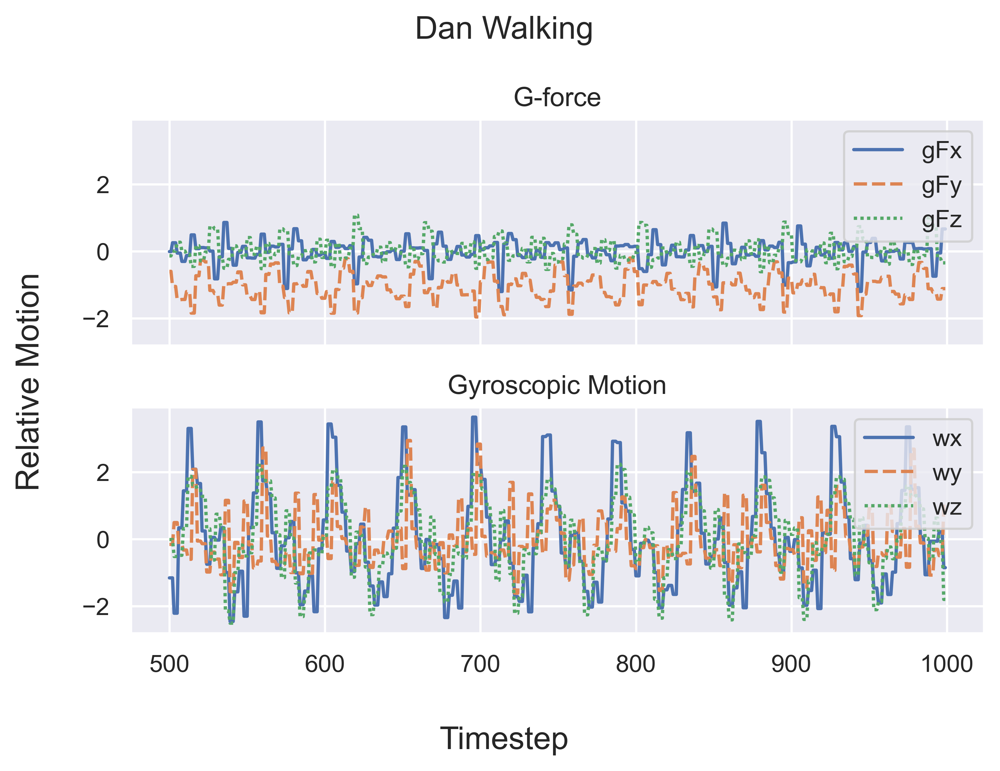

In [176]:
graph_gforce_and_accel('Dan', dan_testing[500:1000])

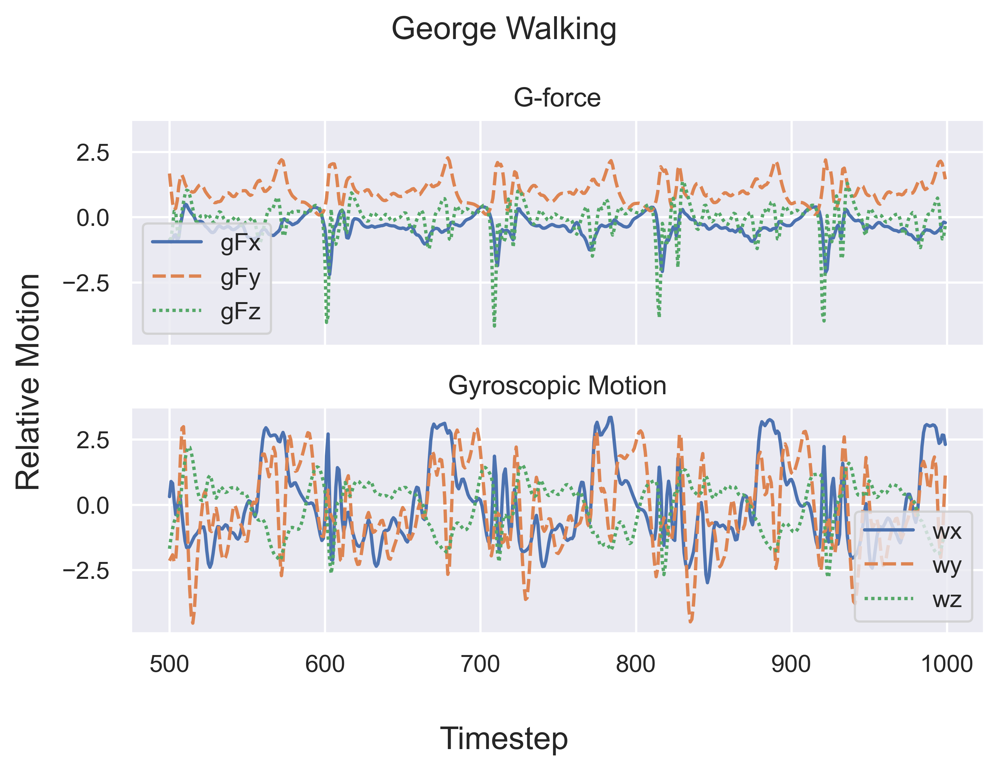

In [177]:
graph_gforce_and_accel('George', george_testing[500:1000])

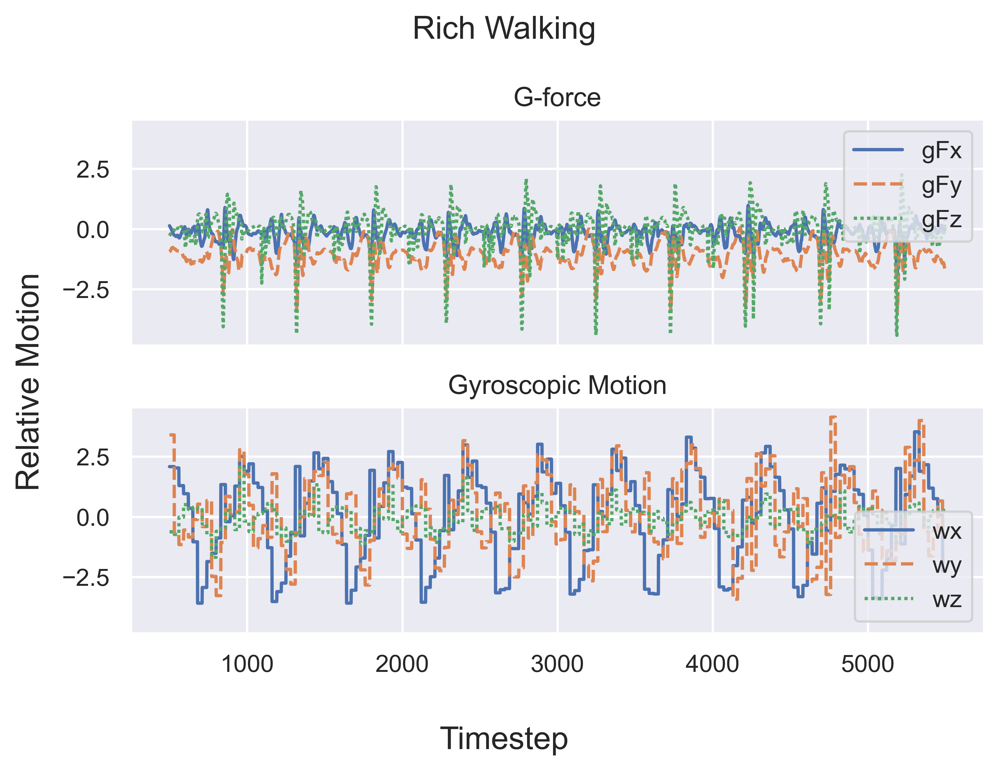

In [179]:
graph_gforce_and_accel('Rich', rich_testing[500:5500])

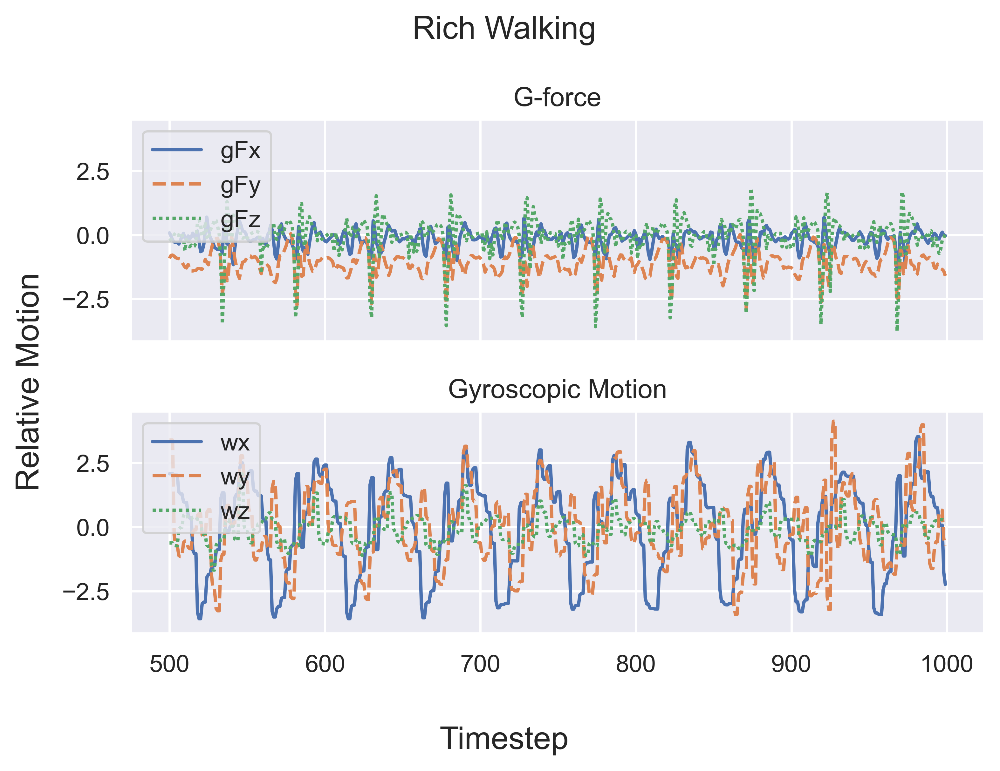

In [341]:
graph_gforce_and_accel('Rich', rich_downsample)

In [187]:
gf_proj = pd.DataFrame()

In [188]:
gf_proj['dan'] = np.sqrt(
    np.power(dan_testing['gFx'], 2)
    + np.power(dan_testing['gFy'], 2)
    + np.power(dan_testing['gFz'], 2)
)[500:1000]

gf_proj['george'] = np.sqrt(
    np.power(george_testing['gFx'], 2)
    + np.power(george_testing['gFy'], 2)
    + np.power(george_testing['gFz'], 2)
)[500:1000]

gf_proj['rich'] = np.average(np.sqrt(
    np.power(rich_testing['gFx'], 2)
    + np.power(rich_testing['gFy'], 2)
    + np.power(rich_testing['gFz'], 2)
)[500:5500].to_numpy().reshape((500, 10)), axis=1)

In [183]:
gyro_proj = pd.DataFrame()

In [184]:
gyro_proj['dan'] = np.sqrt(
    np.power(dan_testing['wx'], 2)
    + np.power(dan_testing['wy'], 2)
    + np.power(dan_testing['wz'], 2)
)[500:1000]

gyro_proj['george'] = np.sqrt(
    np.power(george_testing['wx'], 2)
    + np.power(george_testing['wy'], 2)
    + np.power(george_testing['wz'], 2)
)[500:1000]

gyro_proj['rich'] = np.average(np.sqrt(
    np.power(rich_testing['wx'], 2)
    + np.power(rich_testing['wy'], 2)
    + np.power(rich_testing['wz'], 2)
)[500:5500].to_numpy().reshape((500, 10)), axis=1)

In [185]:
def graph_eucl_proj(gfdata, gydata):
    fig, ax = plt.subplots(2, 1, sharex=True, sharey=True)
    fig.suptitle(f'Euclidan Projection Walking')
    sns.lineplot(
        gfdata,
        ax=ax[0]
    ).set(
        title="G-force",
    )
    sns.lineplot(
        gydata,
        ax=ax[1]
    ).set(
        title="Gyroscopic Motion",
    )
    fig.supxlabel("Timestep")
    fig.supylabel("Relative Motion")
    fig.tight_layout()
    plt.show()

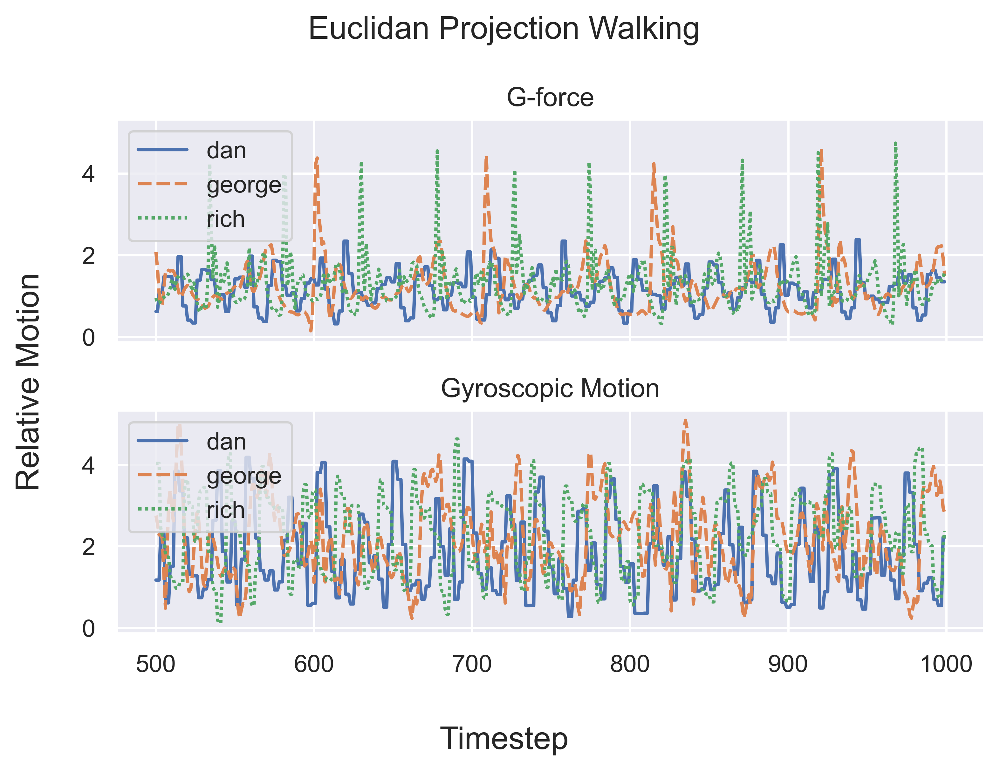

In [189]:
graph_eucl_proj(gf_proj, gyro_proj)

In [331]:
np.average(rich_testing['gFx'][500:5500].to_numpy().reshape((500, 10)), axis=1)

(500,)

In [340]:
rich_downsample = pd.DataFrame()
rich_downsample['time'] = range(500, 1000)
rich_downsample.index = range(500, 1000)
rich_downsample['gFx'] = np.average(rich_testing['gFx'][500:5500].to_numpy().reshape((500, 10)), axis=1)
rich_downsample['gFy'] = np.average(rich_testing['gFy'][500:5500].to_numpy().reshape((500, 10)), axis=1)
rich_downsample['gFz'] = np.average(rich_testing['gFz'][500:5500].to_numpy().reshape((500, 10)), axis=1)
rich_downsample['wx'] = np.average(rich_testing['wx'][500:5500].to_numpy().reshape((500, 10)), axis=1)
rich_downsample['wy'] = np.average(rich_testing['wy'][500:5500].to_numpy().reshape((500, 10)), axis=1)
rich_downsample['wz'] = np.average(rich_testing['wz'][500:5500].to_numpy().reshape((500, 10)), axis=1)

In [322]:
def plot_3d(name, data):
    fig, ax = plt.subplots(1, 2, subplot_kw={'projection': '3d'})
    fig.suptitle(f'{name} Walking')
    ax[0].plot3D(data['gFx'], data['gFy'], data['gFz'], alpha=0.1)
    ax[0].scatter3D(data['gFx'], data['gFy'], data['gFz'], c=cm.hot(
        np.linspace(0.1, 1, num=data.shape[0])),
        alpha=np.linspace(0.1, 1, num=data.shape[0])
    )
    ax[0].set_title('G-force')
    ax[1].plot3D(data['wx'], data['wy'], data['wz'], alpha=0.1)
    ax[1].scatter3D(data['wx'], data['wy'], data['wz'], c=cm.hot(
        np.linspace(0.1, 1, num=data.shape[0])),
        alpha=np.linspace(0.1, 1, num=data.shape[0])
    )
    ax[1].set_title('Gyroscope')
    fig.tight_layout()
    plt.show()

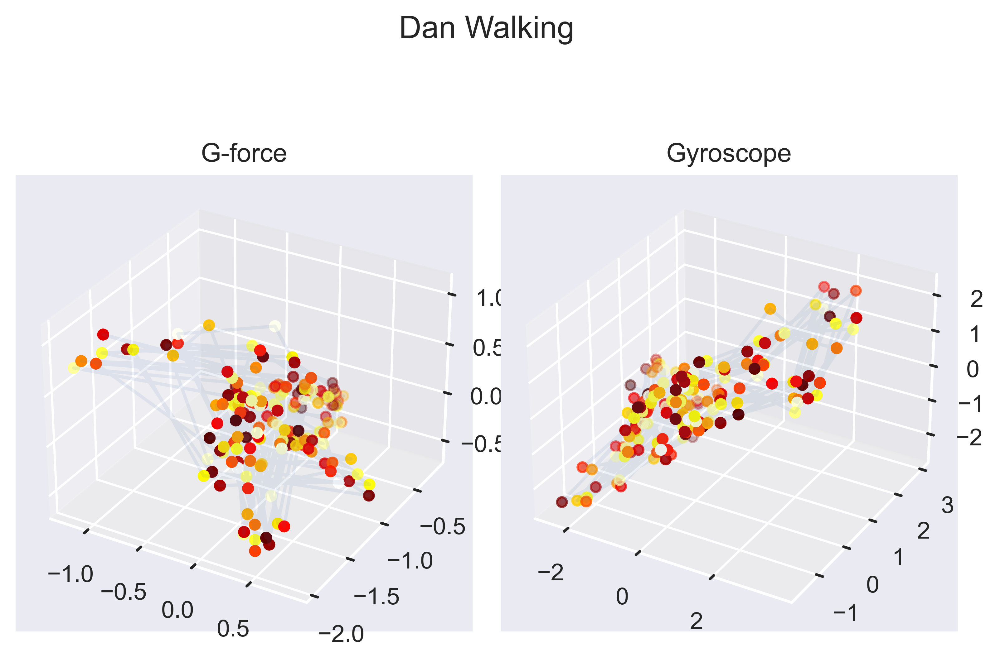

In [323]:
plot_3d('Dan', dan_testing[500:1000])

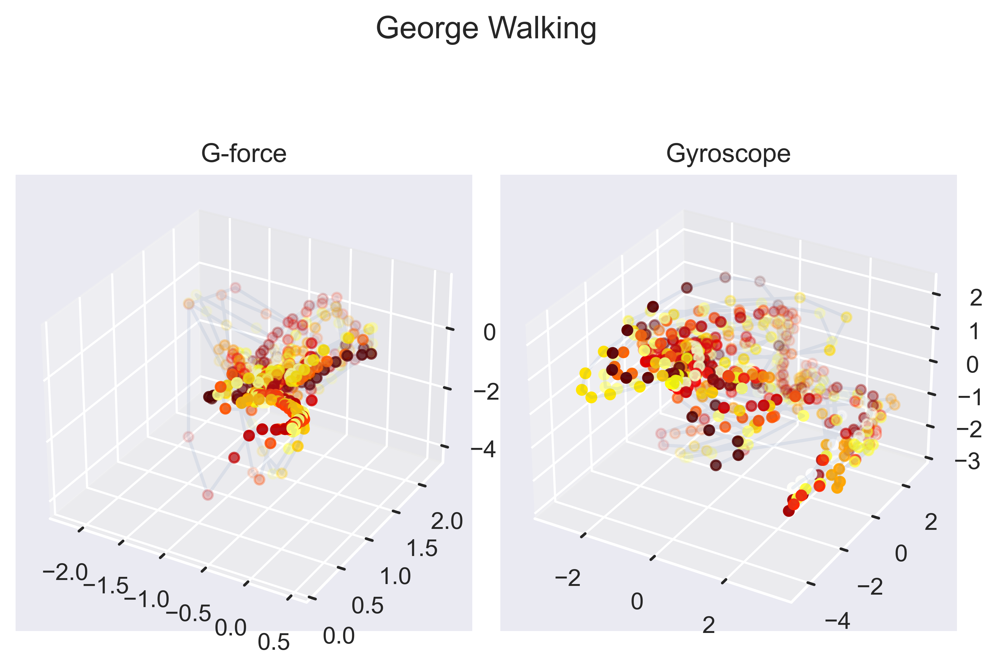

In [324]:
plot_3d('George', george_testing[500:1000])

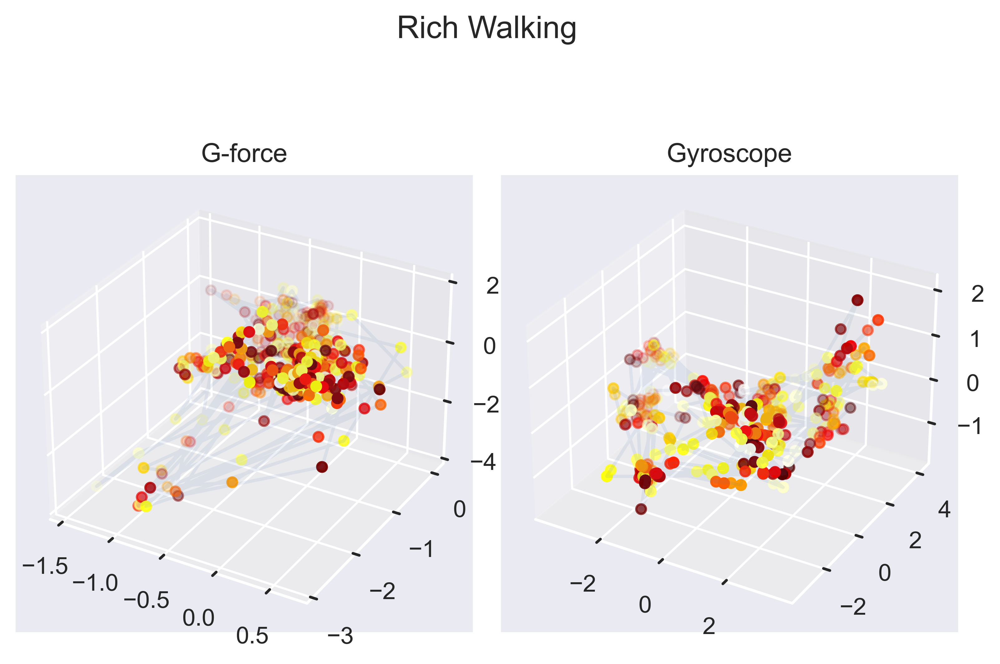

In [333]:
plot_3d('Rich', rich_downsample)

In [296]:
def rotat_anim(data):
    for angle in range(0,360,2):
        ax = plt.axes(projection='3d')
        ax.plot3D(data['gFx'], data['gFy'], data['gFz'], alpha=0.1)
        ax.scatter3D(data['gFx'], data['gFy'], data['gFz'], c=cm.hot(
            np.linspace(0.1, 1, num=data.shape[0])),
            alpha=np.linspace(0.1, 1, num=data.shape[0])
        )

        ax.view_init(30,angle)

        filename='abc_step'+str(angle)+'.png'
        plt.savefig(filename, dpi=96)
        plt.axes(projection='3d')

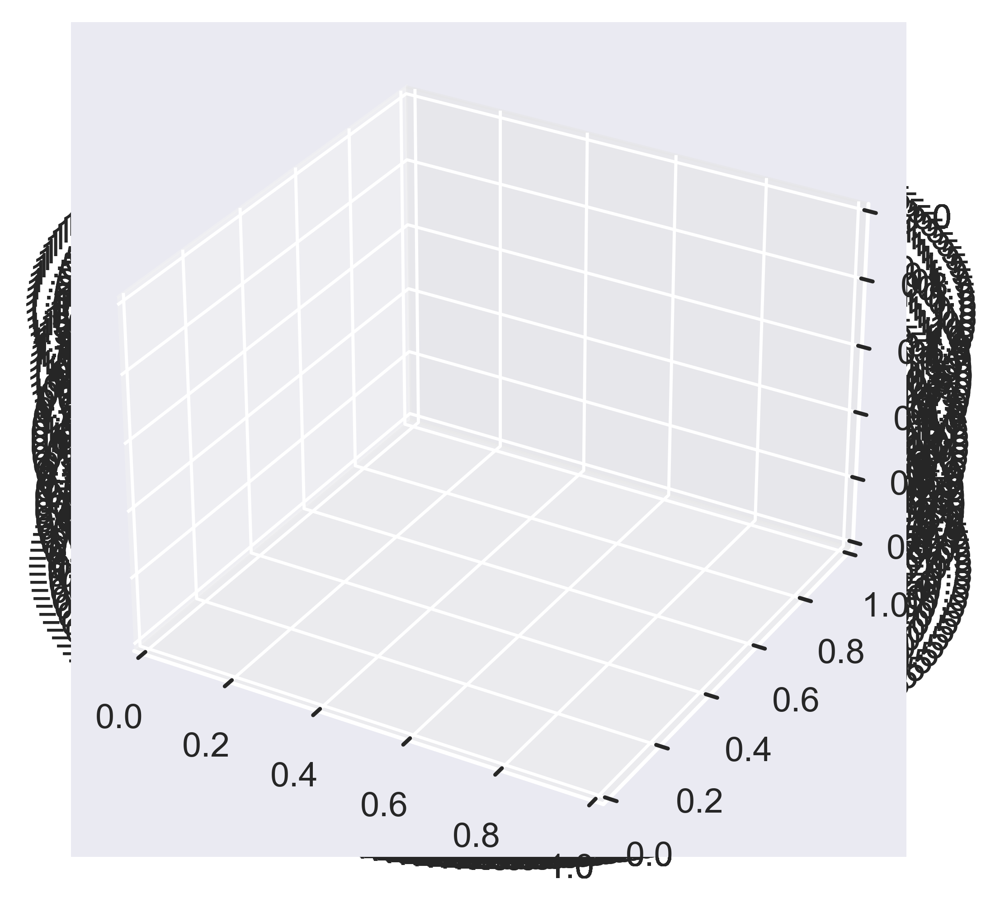

In [297]:
rotat_anim(dan_testing)

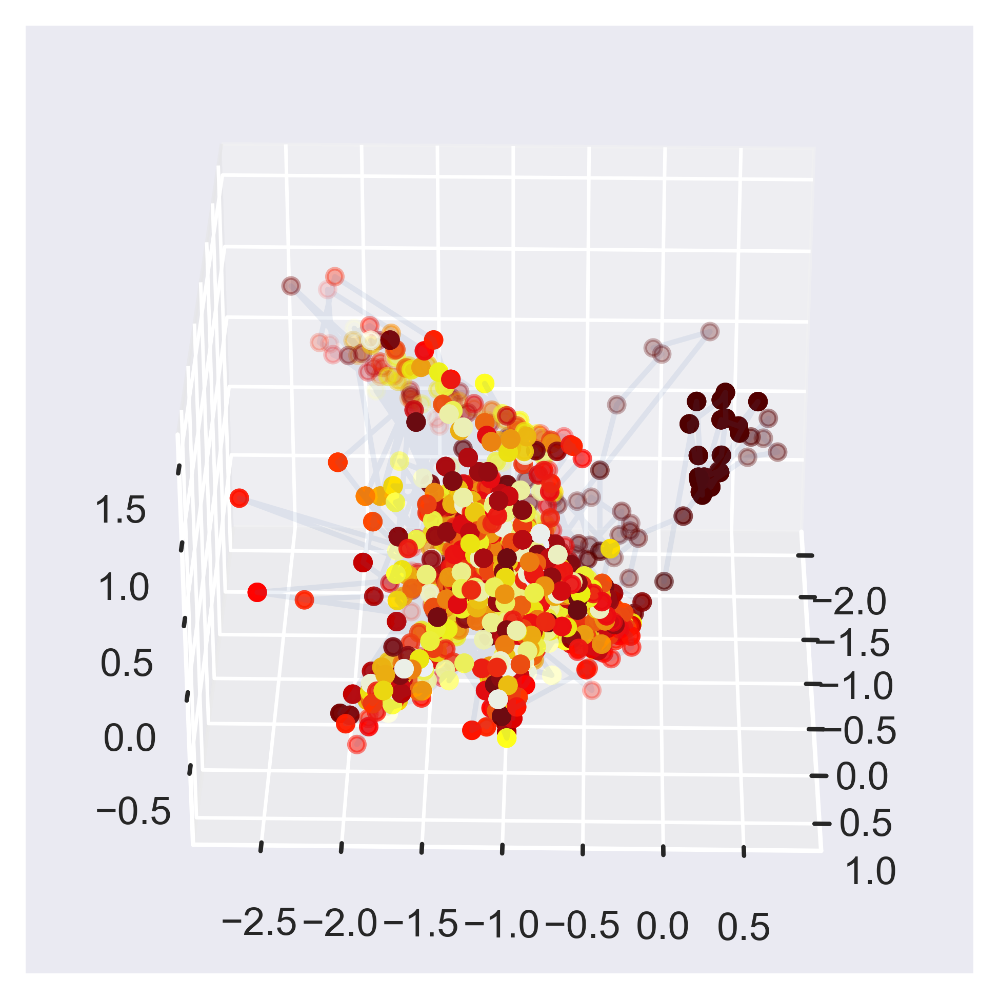

In [303]:
ax = plt.axes(projection='3d')
ax.plot3D(dan_testing['gFx'], dan_testing['gFy'], dan_testing['gFz'], alpha=0.1)
ax.scatter3D(dan_testing['gFx'], dan_testing['gFy'], dan_testing['gFz'], c=cm.hot(
    np.linspace(0.1, 1, num=dan_testing.shape[0])),
    alpha=np.linspace(0.1, 1, num=dan_testing.shape[0])
)

ax.view_init(30,1)

plt.show()

In [304]:
ax.view_init(30, 100)
plt.show()

In [359]:
def rotate_partial_animation(args):
    step, name, all_data, start, end, angle = args
    data = all_data[start:end]
    fig, ax = plt.subplots(1, 2, subplot_kw={'projection': '3d'})
    
    fig.suptitle(f'{name} Walking')
    
    ax[0].plot3D(all_data['gFx'], all_data['gFy'], all_data['gFz'], alpha=0)
    ax[0].plot3D(data['gFx'], data['gFy'], data['gFz'], alpha=0.1)
    ax[0].scatter3D(data['gFx'], data['gFy'], data['gFz'], c=cm.hot(
        np.linspace(0.1, 1, num=data.shape[0])),
        alpha=np.linspace(0.1, 1, num=data.shape[0])
    )
    ax[0].set_title('G-force')
    
    ax[1].plot3D(all_data['wx'], all_data['wy'], all_data['wz'], alpha=0)
    ax[1].plot3D(data['wx'], data['wy'], data['wz'], alpha=0.1)
    ax[1].scatter3D(data['wx'], data['wy'], data['wz'], c=cm.hot(
        np.linspace(0.1, 1, num=data.shape[0])),
        alpha=np.linspace(0.1, 1, num=data.shape[0])
    )
    ax[1].set_title('Gyroscope')
    
    fig.tight_layout()
    
    ax[0].view_init(30, angle)
    ax[1].view_init(30, angle)

    filename = f'{name}_{step}.png'
    plt.savefig(filename)

In [ ]:
win_size = 20
animation_args = list(map(lambda x: (x - 500, 'Dan', dan_testing, x, x + win_size, ((x - 500) % 360)), list(range(500, 1000 - win_size + 1))))
for a in animation_args:
    rotate_partial_animation(a)